In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
import matplotlib.pyplot as plt
import muon as mu

from muon import atac as ac
import os 
import genomicranges as gr
import iranges
lustre_path='/lustre/scratch127/cellgen/cellgeni/tickets/' + os.getcwd().split('/')[4]
lustre_path

/software/conda/users/pm19/muon/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


'/lustre/scratch127/cellgen/cellgeni/tickets/tic-3942'

# snapATAC2

In [2]:
atac = sc.read_h5ad(lustre_path+"/work/results_snapatac2_call_peaks_with_blacklist/subset_adatas/peak_mat.h5ad")
atac

AnnData object with n_obs × n_vars = 127107 × 48913
    obs: 'sample', 'leiden', 'celltype'

In [3]:
atac.X.data

array([1, 2, 1, ..., 1, 1, 2], shape=(1006687730,), dtype=uint32)

## Subset to Granulosa

In [6]:
atac = atac[atac.obs.celltype.str.startswith('Granulosa'),:].copy()
atac

AnnData object with n_obs × n_vars = 3657 × 48913
    obs: 'sample', 'leiden', 'celltype'

In [7]:
# add scANVI gene score embedding
data = sc.read_h5ad(lustre_path+'/work/scanvi_out/combined_gene_matrix_plus_ref_clean_scanvi_raw.h5ad')
data.obs_names = data.obs_names.str.replace('_atac','')
data = data[atac.obs_names,].copy()
data

AnnData object with n_obs × n_vars = 3657 × 5000
    obs: 'Sampling_site_II', 'Developmental_stage', 'coarse_annotation', 'Donor', 'Dataset', 'Sample', 'Age', 'Sampling_site', 'sample', 'dataset', 'dataset_donor', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'coarse_annotation_scanvi', '_scvi_batch', '_scvi_labels', 'C_scANVI', 'leiden_0.5', 'leiden_1', 'leiden_2', 'leiden_3', 'tsse', 'coarse_annotation_bbknn', 'coarse_annotation_bbknn_confidence', 'log10_total_counts'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'C_scANVI_colors', 'Donor_colors', '

In [8]:
atac.obsm['X_scANVI'] = data.obsm['X_scANVI']

In [9]:
# QC and dim reduction

In [10]:
sc.pp.calculate_qc_metrics(atac, percent_top=None, log1p=False, inplace=True)

In [11]:
(atac.var.n_cells_by_counts<10).value_counts()

n_cells_by_counts
False    48356
True       557
Name: count, dtype: int64

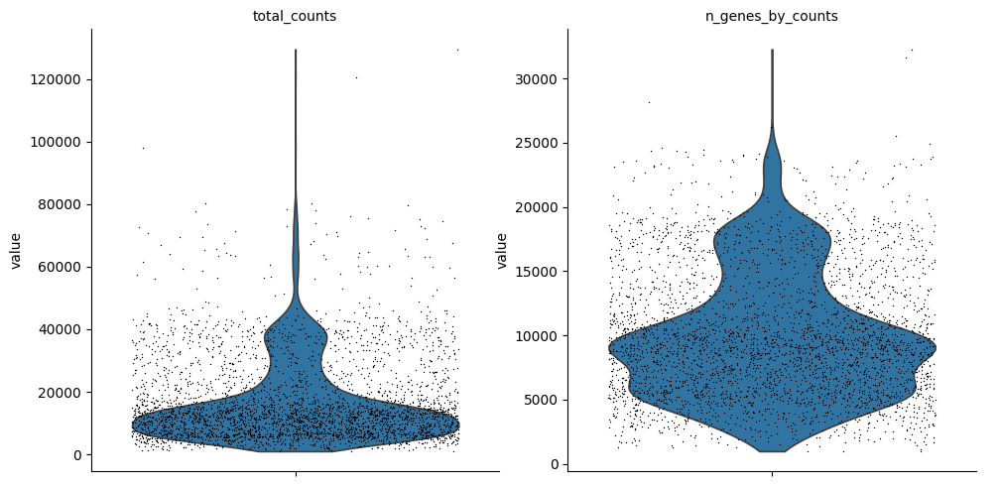

In [12]:
sc.pl.violin(atac, ['total_counts', 'n_genes_by_counts'], jitter=0.4, multi_panel=True)

In [13]:
atac.obs.total_counts.min(),atac.obs.total_counts.max()

(np.uint64(1019), np.uint64(129499))

In [14]:
atac.obs.n_genes_by_counts.min(),atac.obs.n_genes_by_counts.max()

(np.int32(987), np.int32(32281))

In [15]:
f = (atac.obs.total_counts > 4000) & (atac.obs.total_counts < 40000) & (atac.obs.n_genes_by_counts > 2000) & (atac.obs.n_genes_by_counts < 25000)
f.value_counts()

True     3244
False     413
Name: count, dtype: int64

In [16]:
pd.crosstab(atac.obs.celltype,f)

col_0,False,True
celltype,,
Granulosa_AMH_antral,0,1
Granulosa_AMH_antral_HedgLow,0,1
Granulosa_AMH_atr,0,2
Granulosa_AMH_early,16,464
Granulosa_AMH_ml,13,123
Granulosa_sq,313,2428
Granulosa_sq_atr,65,161
Granulosa_sq_transitioning,6,64


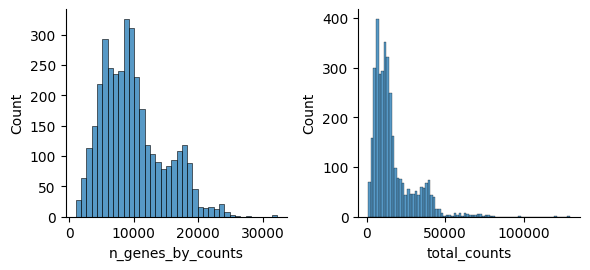

In [17]:
mu.pl.histogram(atac, ['n_genes_by_counts', 'total_counts'])

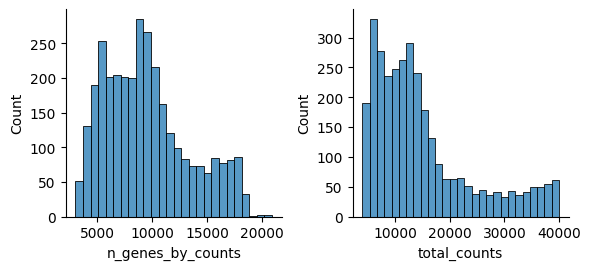

In [18]:
atac = atac[f,]
mu.pl.histogram(atac, ['n_genes_by_counts', 'total_counts'])

### Reload only granulosa

In [2]:
#atac.write_h5ad(lustre_path+"/work/results_snapatac2_call_peaks/subset_adatas/peak_mat_granulosa.h5ad")
atac = sc.read_h5ad(lustre_path+"/work/results_snapatac2_call_peaks/subset_adatas/peak_mat_granulosa.h5ad")

In [3]:
atac.X.data

array([1, 1, 1, ..., 2, 2, 2], shape=(30762211,), dtype=uint32)

In [21]:
#ac.pp.tfidf(atac, scale_factor=1e4)

In [4]:
sc.pp.normalize_total(atac,target_sum =1e4)
sc.pp.log1p(atac)

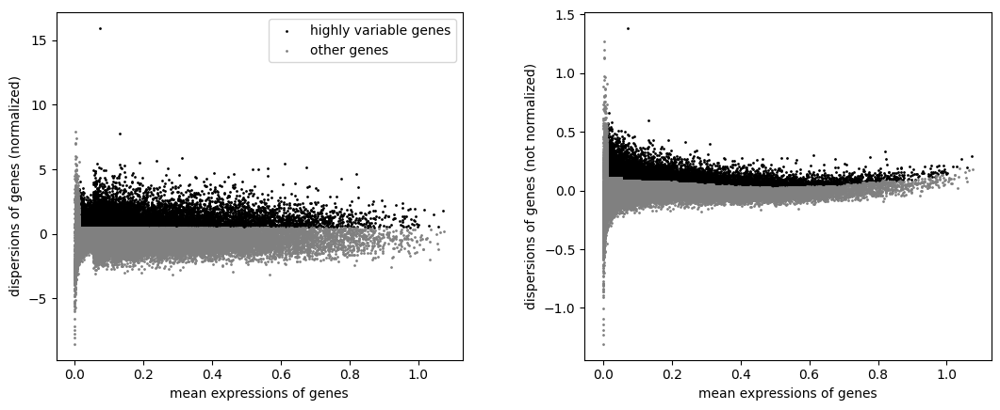

In [5]:
sc.pp.highly_variable_genes(atac)
sc.pl.highly_variable_genes(atac)

In [6]:
atac.raw = atac.copy()

In [7]:
ac.tl.lsi(atac)

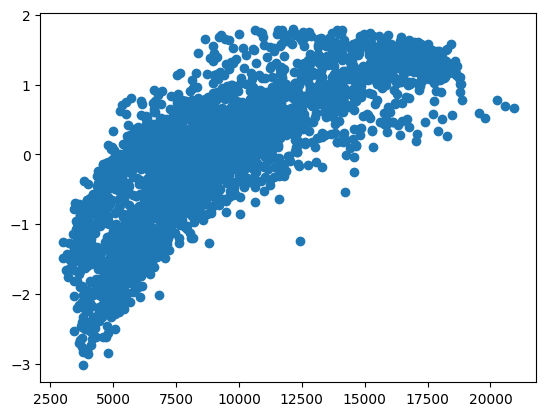

In [8]:
# remove first component as it is "typically associated with number of peaks or counts per cell "
plt.scatter(atac.obs.n_genes_by_counts,atac.obsm['X_lsi'][:,0])

In [9]:
atac.obsm['X_lsi'] = atac.obsm['X_lsi'][:,1:]
atac.varm["LSI"] = atac.varm["LSI"][:,1:]
atac.uns["lsi"]["stdev"] = atac.uns["lsi"]["stdev"][1:]

In [10]:
sc.pp.neighbors(atac, use_rep="X_lsi", n_neighbors=30, n_pcs=30)
sc.tl.umap(atac)

In [11]:
sc.pp.neighbors(atac, use_rep="X_scANVI", n_neighbors=10, n_pcs=30)
sc.tl.umap(atac,key_added='X_scANVI_umap')

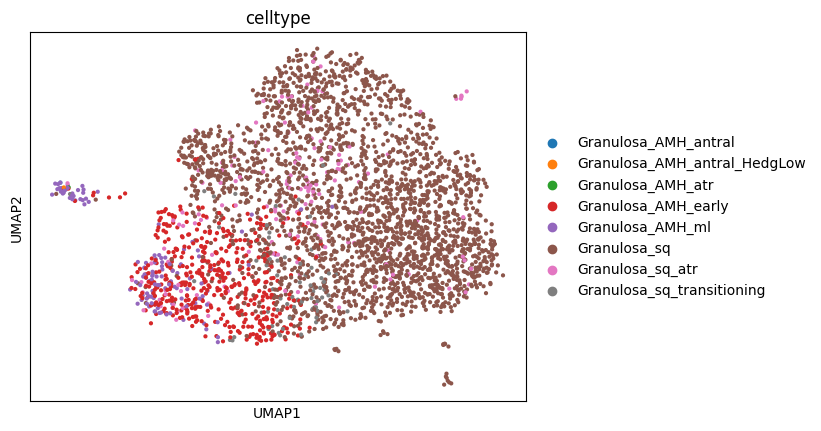

In [12]:
sc.pl.umap(atac,color=['celltype'])

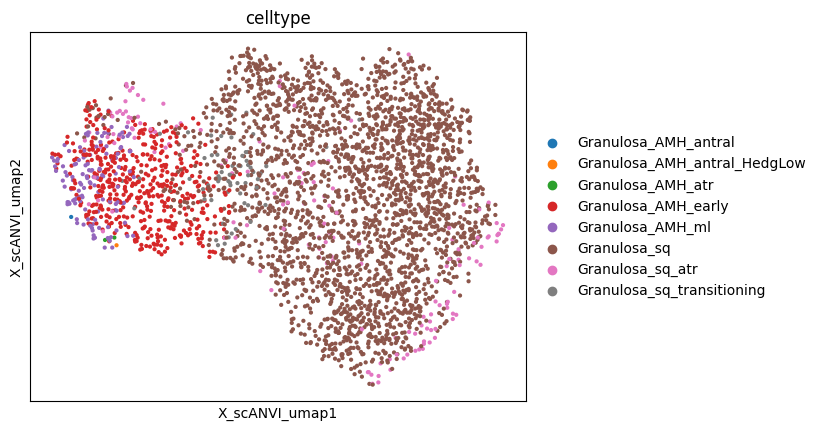

In [13]:
sc.pl.embedding(atac,color=['celltype'],basis='X_scANVI_umap')

In [14]:
atac.obs.celltype.value_counts()

celltype
Granulosa_sq                    2428
Granulosa_AMH_early              464
Granulosa_sq_atr                 161
Granulosa_AMH_ml                 123
Granulosa_sq_transitioning        64
Granulosa_AMH_atr                  2
Granulosa_AMH_antral               1
Granulosa_AMH_antral_HedgLow       1
Name: count, dtype: int64

In [15]:
samples = pd.read_csv(lustre_path+'/data/Table1-dataset_metadata - scATACseq_SangerPediatric.csv',index_col=0)
samples

,Dataset,Donor,Age,Developmental_stage,Sampling_site,Sampling_site_II,Sample_type,ion,DATE,Source ID,...,Developmental_stage.1,Tissue,Diagnosis,Sample state,Viability,10X,Comments_protocol,Sorting,Sample ID,irods
Sanger Sample ID,,,,,,,,,,,,,,,,,,,,,
HCA_P_GON_CZI12220527,Sanger_pediatric,AUrv2,15,pubertal,Cortex,Cortex_outer,cryopreserved,Paedriatic ovary,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,AUrv10-OVR-0-SC-1bmA,/seq/illumina/runs/43/43719/cellranger-atac/ce...
HCA_P_GON_CZI12220528,Sanger_pediatric,AUrv2,15,pubertal,Cortex,Cortex_outer,cryopreserved,Paedriatic ovary,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,AUrv2-OVR-0-SN-2a,/seq/illumina/runs/43/43719/cellranger-atac/ce...
HCA_P_GON_CZI13187906,Sanger_pediatric,AUrv10,10,paediatric,Cortex,Cortex_outer,cryopreserved,Paedriatic ovary,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,AUrv2-OVR-0-FO-2b,/seq/illumina/runs/46/46095/cellranger-atac/ce...
HCA_P_GON_CZI13654496,Sanger_pediatric,AUrv14,3,paediatric,Cortex,Cortex_outer,fresh,Paedriatic ovary,23/02/2023,H22/OV/1254,...,paediatric,ovary,#REF!,processed fresh,60%,ATAC,Protocol: Ovary Tissue dissociation V2,Live/Dead,AUrv14-OVR-0-SC-FACS-2,/seq/illumina/runs/47/47082/cellranger-atac/ce...
HCA_P_GON_CZI13737937,Sanger_pediatric,AUrv15,13,pubertal,Cortex,Cortex_outer,fresh,Paedriatic ovary,30/03/2023,H23/OV/1327,...,paediatric,ovary,#REF!,processed fresh,66%,ATAC,Protocol: Ovary Tissue dissociation V2,Live/Dead,AUrv15-OVR-0-SC-FACS-3,/seq/illumina/runs/47/47290/cellranger-atac/ce...
HCA_P_GON_CZI13941754,Sanger_pediatric,AUrv16,14,pubertal,Cortex,Cortex_outer,fresh,Paedriatic ovary,12/05/2023,H23/OV/1331,...,paediatric,ovary,#REF!,processed fresh,34% before sorter,ATAC,Protocol: Ovary Tissue dissociation V2,Live/Dead 77%,AU16-OVR-0-SC-FACS-2,/seq/illumina/runs/47/47776/cellranger-atac/ce...
HCA_P_GON_CZI13941755,Sanger_pediatric,AUrv17,5,paediatric,Cortex,Cortex_outer_inner,fresh,Paedriatic ovary,26/05/2023,H23/OV/1354,...,paediatric,ovary,NaN,processed fresh,60% before sorter,ATAC,Protocol: Ovary Tissue dissociation V2,Live/Dead 91%,AU17-OVR-0-SC-FACS-2,/seq/illumina/runs/47/47776/cellranger-atac/ce...
HCA_P_GON_CZI13941756,Sanger_pediatric,AUrv18,2,paediatric,Cortex,Cortex_outer_inner,fresh,Paedriatic ovary,07/06/2023,H23/OV/1363,...,paediatric,ovary,#REF!,processed fresh,35% before sorter,ATAC v2,Protocol: Ovary Tissue dissociation V2,Live/Dead 90%,AU18-OVR-0-SC-FACS-2,/seq/illumina/runs/47/47776/cellranger-atac/ce...
HCA_P_GON_CZI13941757,Sanger_pediatric,AUrv20,15,pubertal,Cortex,Cortex_outer,fresh,Paedriatic ovary,06/07/2023,H23/OV/1378,...,paediatric,ovary,#REF!,processed fresh,50% before sorter,ATAC v2,Protocol: Ovary Tissue dissociation V2,Live/Dead 85%,AU20-OVR-0-SC-FACS-3,/seq/illumina/runs/47/47776/cellranger-atac/ce...


In [16]:
categories_order = ['Granulosa_sq','Granulosa_sq_atr','Granulosa_sq_transitioning','Granulosa_AMH_early','Granulosa_AMH_ml']
pd.crosstab(atac.obs['sample'],atac.obs.celltype).loc[:,categories_order]

celltype,Granulosa_sq,Granulosa_sq_atr,Granulosa_sq_transitioning,Granulosa_AMH_early,Granulosa_AMH_ml
sample,,,,,
HCA_P_GON_CZI12220527,19,4,0,0,0
HCA_P_GON_CZI12220528,3,0,0,0,0
HCA_P_GON_CZI13187906,6,0,0,6,0
HCA_P_GON_CZI13654496,96,38,8,209,67
HCA_P_GON_CZI13737937,20,1,0,19,8
HCA_P_GON_CZI13941754,110,4,0,7,0
HCA_P_GON_CZI13941755,60,0,2,22,3
HCA_P_GON_CZI13941756,22,16,6,19,32
HCA_P_GON_CZI13941757,1,1,2,6,0


In [17]:
x=list(samples.loc[atac.obs['sample'],'Developmental_stage'])
pd.crosstab(x,atac.obs.celltype).loc[:,categories_order]

celltype,Granulosa_sq,Granulosa_sq_atr,Granulosa_sq_transitioning,Granulosa_AMH_early,Granulosa_AMH_ml
row_0,,,,,
paediatric,2082,133,53,355,113
postpubertal,4,2,1,7,0
pubertal,342,26,10,102,10


In [18]:
x=list(samples.loc[atac.obs['sample'],'Age'])
pd.crosstab(x,atac.obs.celltype).loc[:,categories_order]

celltype,Granulosa_sq,Granulosa_sq_atr,Granulosa_sq_transitioning,Granulosa_AMH_early,Granulosa_AMH_ml
row_0,,,,,
1,55,14,1,6,0
2,22,16,6,19,32
3,96,38,8,209,67
5,584,42,4,37,7
6,22,2,5,20,7
7,1297,21,29,58,0
10,60,1,3,12,0
11,42,12,2,39,1
13,50,2,0,24,8


## DARs

In [19]:
sc.tl.rank_genes_groups(atac,groupby='celltype',
                        groups=['Granulosa_sq','Granulosa_AMH_early','Granulosa_sq_atr','Granulosa_AMH_ml','Granulosa_sq_transitioning'],
                        method='wilcoxon',pts=True,use_raw=True)

In [51]:
markers = sc.get.rank_genes_groups_df(atac,group=None)
markers

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference
0,Granulosa_sq,chr6:112562433-112562934,27.724682,2.529666,5.584338e-146,2.731691e-141,0.614498,0.133578
1,Granulosa_sq,chr17:8420231-8420732,24.807043,3.208147,7.581599e-124,1.854345e-119,0.402389,0.042892
2,Granulosa_sq,chr18:58828334-58828835,23.452438,2.341442,2.667901e-109,4.350190e-105,0.524300,0.120098
3,Granulosa_sq,chr21:39023231-39023732,21.295227,2.348202,3.192921e-92,3.904703e-88,0.460873,0.099265
4,Granulosa_sq,chr5:149406492-149406993,20.538692,2.109268,3.176795e-86,3.107986e-82,0.483114,0.139706
...,...,...,...,...,...,...,...,...
244580,Granulosa_sq_transitioning,chr1:41474611-41475112,-22.848118,-26.625900,4.130945e-107,4.041469e-103,0.000000,0.167925
244581,Granulosa_sq_transitioning,chr5:147743571-147744072,-23.132025,-26.564592,1.516793e-109,1.854924e-105,0.000000,0.166981
244582,Granulosa_sq_transitioning,chr7:29465502-29466003,-23.672625,-26.703951,3.058734e-114,4.987469e-110,0.000000,0.181132
244583,Granulosa_sq_transitioning,chr11:79852625-79853126,-25.473600,-27.046978,2.040110e-130,4.989803e-126,0.000000,0.203459


In [52]:
markers[(markers.pvals_adj<0.05) & (markers.logfoldchanges > 2) & markers.pct_nz_group> 0.2]

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference
0,Granulosa_sq,chr6:112562433-112562934,27.724682,2.529666,5.584338e-146,2.731691e-141,0.614498,0.133578
1,Granulosa_sq,chr17:8420231-8420732,24.807043,3.208147,7.581599e-124,1.854345e-119,0.402389,0.042892
2,Granulosa_sq,chr18:58828334-58828835,23.452438,2.341442,2.667901e-109,4.350190e-105,0.524300,0.120098
3,Granulosa_sq,chr21:39023231-39023732,21.295227,2.348202,3.192921e-92,3.904703e-88,0.460873,0.099265
4,Granulosa_sq,chr5:149406492-149406993,20.538692,2.109268,3.176795e-86,3.107986e-82,0.483114,0.139706
...,...,...,...,...,...,...,...,...
195720,Granulosa_sq_transitioning,chr11:73157427-73157928,3.130599,2.294490,2.633431e-03,1.759109e-02,0.218750,0.049057
195774,Granulosa_sq_transitioning,chr20:279157-279658,2.821700,2.052745,6.362393e-03,3.855186e-02,0.203125,0.054403
195780,Granulosa_sq_transitioning,chr3:26598658-26599159,2.801951,2.827130,6.728929e-03,4.044716e-02,0.156250,0.027673
195786,Granulosa_sq_transitioning,chr1:53971733-53972234,2.768034,2.294119,7.381357e-03,4.389422e-02,0.187500,0.053459


In [53]:
#top5 = markers[(markers.pvals_adj<0.05) & (markers.logfoldchanges > 2) & (markers.pct_nz_group> 0.3) & (markers.pct_nz_reference<0.1)].groupby('group').head(5)
top5 = markers[(markers.pvals_adj<0.01) & (markers.logfoldchanges > 2)].groupby('group').head(5)
top5

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference
0,Granulosa_sq,chr6:112562433-112562934,27.724682,2.529666,5.584338e-146,2.731691e-141,0.614498,0.133578
1,Granulosa_sq,chr17:8420231-8420732,24.807043,3.208147,7.581599e-124,1.854345e-119,0.402389,0.042892
2,Granulosa_sq,chr18:58828334-58828835,23.452438,2.341442,2.667901e-109,4.350190e-105,0.524300,0.120098
3,Granulosa_sq,chr21:39023231-39023732,21.295227,2.348202,3.192921e-92,3.904703e-88,0.460873,0.099265
4,Granulosa_sq,chr5:149406492-149406993,20.538692,2.109268,3.176795e-86,3.107986e-82,0.483114,0.139706
48917,Granulosa_AMH_early,chr22:22559058-22559559,12.748835,2.227203,1.495490e-32,1.866196e-30,0.454741,0.126978
48918,Granulosa_AMH_early,chr19:8367313-8367814,12.048816,2.007194,1.116597e-29,1.177168e-27,0.443966,0.146763
48919,Granulosa_AMH_early,chr20:51022947-51023448,11.326223,2.442520,1.227892e-26,1.090105e-24,0.362069,0.090647
48923,Granulosa_AMH_early,chr16:18983635-18984136,9.676194,2.162203,1.977048e-20,1.177969e-18,0.310345,0.088129
48924,Granulosa_AMH_early,chr17:76480554-76481055,9.557272,2.262193,5.280654e-20,3.031851e-18,0.293103,0.075540


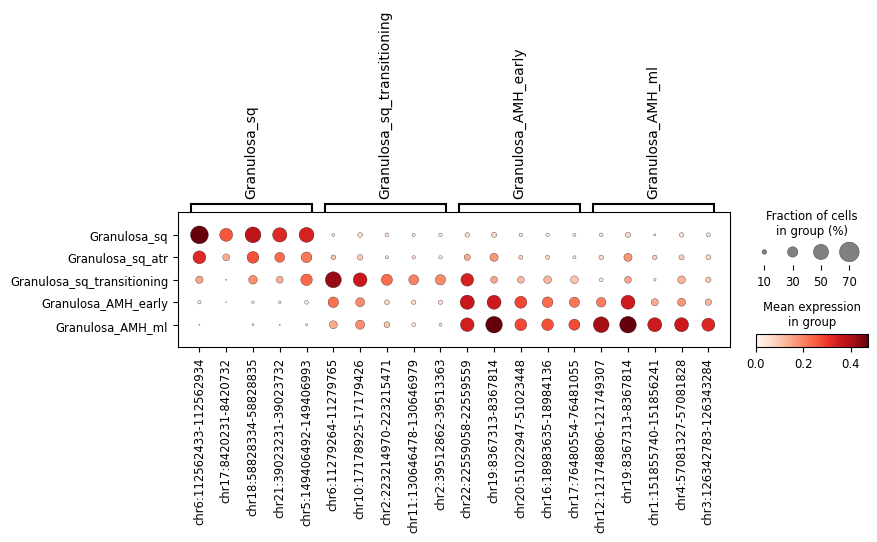

In [54]:
categories_order = ['Granulosa_sq','Granulosa_sq_atr','Granulosa_sq_transitioning','Granulosa_AMH_early','Granulosa_AMH_ml']
peaks = {g:top5.names[top5.group==g] for g in categories_order if (top5.group==g).sum(0)>0}
sc.pl.dotplot(atac[atac.obs.celltype.isin(categories_order)],peaks,groupby='celltype',categories_order=categories_order)

In [55]:
peaksn = []
for v in peaks.values():
    peaksn.extend(v)    

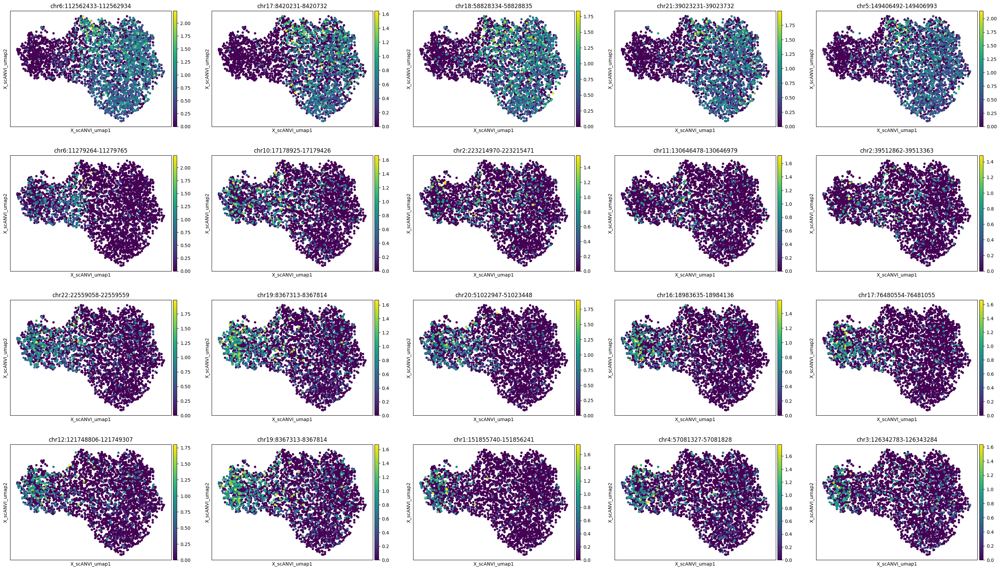

In [56]:
sc.pl.embedding(atac,color=peaksn,basis='X_scANVI_umap',size=100,sort_order=True,ncols=5)

In [57]:
markers[(markers.pvals_adj<0.05) & (markers.logfoldchanges > np.log(2))].to_csv('snapatac2_granulosa_dars.csv')
markers.to_csv('snapatac2_granulosa_all_peaks.csv')

# pycistopic

In [2]:
patac = sc.read_h5ad(lustre_path+'/work/pycistopic/results_pycistopic_call_peaks/combined.h5ad')
del patac.layers['binary']
patac.obs_names = patac.obs.sample_id.astype(str) +":"+patac.obs.barcode.astype(str)
patac

AnnData object with n_obs × n_vars = 144106 × 645326
    obs: 'cisTopic_nr_frag', 'cisTopic_log_nr_frag', 'cisTopic_nr_acc', 'cisTopic_log_nr_acc', 'sample_id', 'barcode_rank', 'total_fragments_count', 'log10_total_fragments_count', 'unique_fragments_count', 'log10_unique_fragments_count', 'total_fragments_in_peaks_count', 'log10_total_fragments_in_peaks_count', 'unique_fragments_in_peaks_count', 'log10_unique_fragments_in_peaks_count', 'fraction_of_fragments_in_peaks', 'duplication_count', 'duplication_ratio', 'nucleosome_signal', 'tss_enrichment', 'pdf_values_for_tss_enrichment', 'pdf_values_for_fraction_of_fragments_in_peaks', 'pdf_values_for_duplication_ratio', 'barcode'

In [3]:
celltype = pd.read_csv(lustre_path+'/work/scanvi_out/combined_gene_matrix_plus_ref_clean_scanvi_raw_obs.csv')
celltype.index = celltype.sample_id +":"+celltype.barcode
celltype

,sample_id,barcode,celltype
HCA_P_GON_CZI14524754:AAACGAAGTACGCCCA-1,HCA_P_GON_CZI14524754,AAACGAAGTACGCCCA-1,Stroma_InnCor
HCA_P_GON_CZI14524754:AAACGAATCGCTTGAA-1,HCA_P_GON_CZI14524754,AAACGAATCGCTTGAA-1,Stroma_OutCor_Foll
HCA_P_GON_CZI14524754:AAACGAATCTTTGCAT-1,HCA_P_GON_CZI14524754,AAACGAATCTTTGCAT-1,Stroma_Perifoll_InnCor
HCA_P_GON_CZI14524754:AAACTCGCAAATTGAG-1,HCA_P_GON_CZI14524754,AAACTCGCAAATTGAG-1,Theca_1perifollicular
HCA_P_GON_CZI14524754:AAACTCGGTTAGGCTT-1,HCA_P_GON_CZI14524754,AAACTCGGTTAGGCTT-1,Stroma_InnCor
...,...,...,...
HCA_P_GON_CZI14609780:TTTGTGTGTCTGAGCC-1,HCA_P_GON_CZI14609780,TTTGTGTGTCTGAGCC-1,Stroma_OutCor_Foll
HCA_P_GON_CZI14609780:TTTGTGTGTGGTCGAA-1,HCA_P_GON_CZI14609780,TTTGTGTGTGGTCGAA-1,Stroma_OutCor_Foll
HCA_P_GON_CZI14609780:TTTGTGTGTTCAGTTG-1,HCA_P_GON_CZI14609780,TTTGTGTGTTCAGTTG-1,PV_SMC_Arterial
HCA_P_GON_CZI14609780:TTTGTGTGTTTCCTAT-1,HCA_P_GON_CZI14609780,TTTGTGTGTTTCCTAT-1,Stroma_OutCor_Foll


In [4]:
pd.Series(patac.obs_names.isin(celltype.index)).value_counts()

True     125936
False     18170
Name: count, dtype: int64

In [5]:
pd.Series(celltype.index.isin(patac.obs_names)).value_counts()

True     125936
False      1171
Name: count, dtype: int64

In [11]:
cmn = list(set(celltype.index).intersection(set(patac.obs_names)))
celltype = celltype.loc[cmn,:]
patac = patac[cmn,]
patac.obs['celltype'] = celltype.celltype

/tmp/ipykernel_2247066/2677485579.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  patac.obs['celltype'] = celltype.celltype


In [12]:
patac.var

""
RegionIDs
chr1:831862-832362
chr1:833362-833862
chr1:834121-834621
chr1:874429-874929
chr1:879007-879507
...
chrX:40166524-40167024
chrX:154357329-154357829
chrX:25007837-25008337


## Subset to Granulosa

In [13]:
patac = patac[patac.obs.celltype.str.startswith('Granulosa'),:].copy()
patac

AnnData object with n_obs × n_vars = 3636 × 645326
    obs: 'cisTopic_nr_frag', 'cisTopic_log_nr_frag', 'cisTopic_nr_acc', 'cisTopic_log_nr_acc', 'sample_id', 'barcode_rank', 'total_fragments_count', 'log10_total_fragments_count', 'unique_fragments_count', 'log10_unique_fragments_count', 'total_fragments_in_peaks_count', 'log10_total_fragments_in_peaks_count', 'unique_fragments_in_peaks_count', 'log10_unique_fragments_in_peaks_count', 'fraction_of_fragments_in_peaks', 'duplication_count', 'duplication_ratio', 'nucleosome_signal', 'tss_enrichment', 'pdf_values_for_tss_enrichment', 'pdf_values_for_fraction_of_fragments_in_peaks', 'pdf_values_for_duplication_ratio', 'barcode', 'celltype'

In [14]:
# add scANVI gene score embedding
data = sc.read_h5ad(lustre_path+'/work/scanvi_out/combined_gene_matrix_plus_ref_clean_scanvi_raw.h5ad')
data.obs_names = data.obs_names.str.replace('_atac','')
data = data[patac.obs_names,].copy()
data

AnnData object with n_obs × n_vars = 3636 × 5000
    obs: 'Sampling_site_II', 'Developmental_stage', 'coarse_annotation', 'Donor', 'Dataset', 'Sample', 'Age', 'Sampling_site', 'sample', 'dataset', 'dataset_donor', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'coarse_annotation_scanvi', '_scvi_batch', '_scvi_labels', 'C_scANVI', 'leiden_0.5', 'leiden_1', 'leiden_2', 'leiden_3', 'tsse', 'coarse_annotation_bbknn', 'coarse_annotation_bbknn_confidence', 'log10_total_counts'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'C_scANVI_colors', 'Donor_colors', '

In [15]:
patac.obsm['X_scANVI'] = data.obsm['X_scANVI']

In [10]:
# QC and dim reduction

In [16]:
sc.pp.calculate_qc_metrics(patac, percent_top=None, log1p=False, inplace=True)

In [20]:
(patac.var.n_cells_by_counts<10).value_counts()
patac = patac[:,patac.var.n_cells_by_counts>=10]
patac

View of AnnData object with n_obs × n_vars = 3636 × 546631
    obs: 'cisTopic_nr_frag', 'cisTopic_log_nr_frag', 'cisTopic_nr_acc', 'cisTopic_log_nr_acc', 'sample_id', 'barcode_rank', 'total_fragments_count', 'log10_total_fragments_count', 'unique_fragments_count', 'log10_unique_fragments_count', 'total_fragments_in_peaks_count', 'log10_total_fragments_in_peaks_count', 'unique_fragments_in_peaks_count', 'log10_unique_fragments_in_peaks_count', 'fraction_of_fragments_in_peaks', 'duplication_count', 'duplication_ratio', 'nucleosome_signal', 'tss_enrichment', 'pdf_values_for_tss_enrichment', 'pdf_values_for_fraction_of_fragments_in_peaks', 'pdf_values_for_duplication_ratio', 'barcode', 'celltype', 'n_genes_by_counts', 'total_counts'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    obsm: 'X_scANVI'

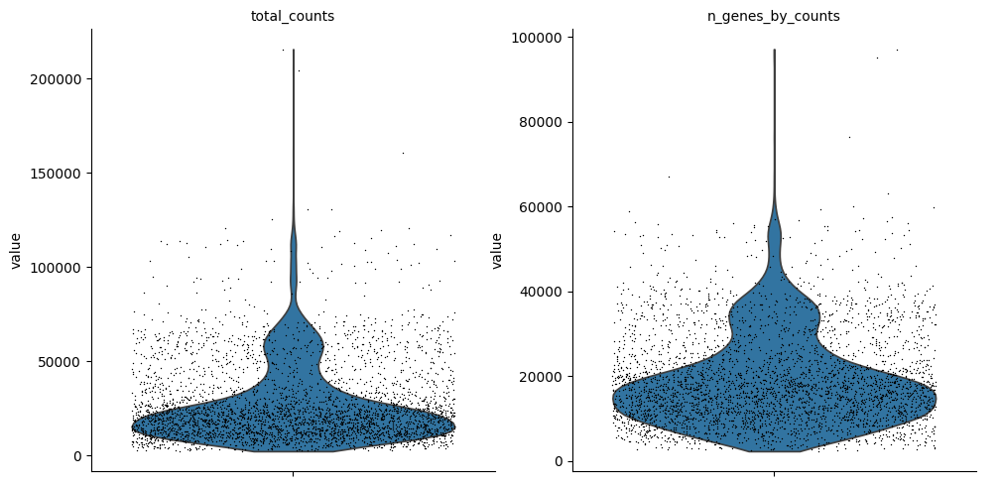

In [21]:
sc.pl.violin(patac, ['total_counts', 'n_genes_by_counts'], jitter=0.4, multi_panel=True)

In [23]:
patac.obs.total_counts.min(),patac.obs.total_counts.max()

(np.int64(2394), np.int64(215687))

In [24]:
patac.obs.n_genes_by_counts.min(),patac.obs.n_genes_by_counts.max()

(np.int32(2323), np.int32(97104))

In [26]:
f = (patac.obs.total_counts > 4000) & (patac.obs.total_counts < 100000) & (patac.obs.n_genes_by_counts > 2000) & (patac.obs.n_genes_by_counts < 50000)
f.value_counts()

True     3541
False      95
Name: count, dtype: int64

In [28]:
pd.crosstab(patac.obs.celltype,f)

col_0,False,True
celltype,,
Granulosa_AMH_antral,0,1
Granulosa_AMH_antral_HedgLow,0,1
Granulosa_AMH_atr,0,2
Granulosa_AMH_early,0,480
Granulosa_AMH_ml,2,134
Granulosa_sq,77,2654
Granulosa_sq_atr,15,200
Granulosa_sq_transitioning,1,69


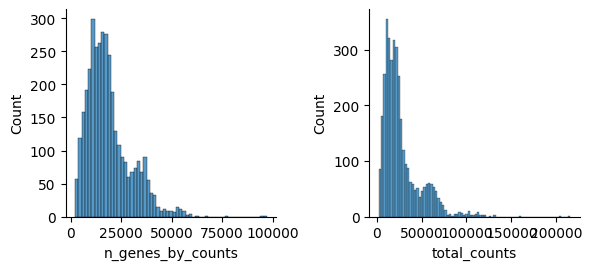

In [29]:
mu.pl.histogram(patac, ['n_genes_by_counts', 'total_counts'])

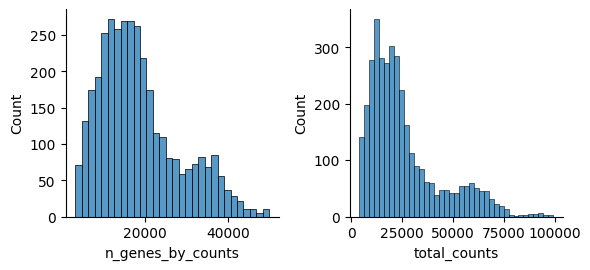

In [30]:
patac = patac[f,]
mu.pl.histogram(patac, ['n_genes_by_counts', 'total_counts'])

### Reload only granulosa

In [26]:
patac

AnnData object with n_obs × n_vars = 3541 × 546631
    obs: 'cisTopic_nr_frag', 'cisTopic_log_nr_frag', 'cisTopic_nr_acc', 'cisTopic_log_nr_acc', 'sample_id', 'barcode_rank', 'total_fragments_count', 'log10_total_fragments_count', 'unique_fragments_count', 'log10_unique_fragments_count', 'total_fragments_in_peaks_count', 'log10_total_fragments_in_peaks_count', 'unique_fragments_in_peaks_count', 'log10_unique_fragments_in_peaks_count', 'fraction_of_fragments_in_peaks', 'duplication_count', 'duplication_ratio', 'nucleosome_signal', 'tss_enrichment', 'pdf_values_for_tss_enrichment', 'pdf_values_for_fraction_of_fragments_in_peaks', 'pdf_values_for_duplication_ratio', 'barcode', 'celltype', 'n_genes_by_counts', 'total_counts'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    obsm: 'X_scANVI'

In [27]:
patac.X.data

array([1, 1, 1, ..., 1, 1, 1], shape=(64905557,), dtype=int32)

In [28]:
patac.raw = patac.copy()

In [31]:
#ac.pp.tfidf(atac, scale_factor=1e4)

In [29]:
sc.pp.normalize_total(patac,target_sum =1e4)
sc.pp.log1p(patac)

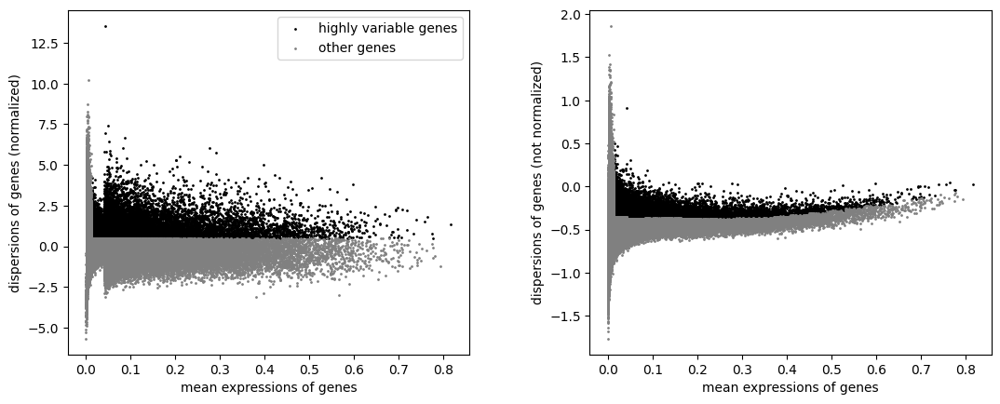

In [30]:
sc.pp.highly_variable_genes(patac)
sc.pl.highly_variable_genes(patac)

In [31]:
ac.tl.lsi(patac)

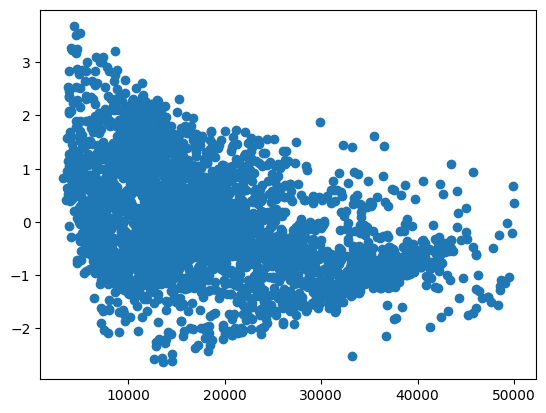

In [32]:
# remove first component as it is "typically associated with number of peaks or counts per cell "
plt.scatter(patac.obs.n_genes_by_counts,patac.obsm['X_lsi'][:,0])

In [37]:
#atac.obsm['X_lsi'] = atac.obsm['X_lsi'][:,1:]
#atac.varm["LSI"] = atac.varm["LSI"][:,1:]
#atac.uns["lsi"]["stdev"] = atac.uns["lsi"]["stdev"][1:]

In [33]:
sc.pp.neighbors(patac, use_rep="X_lsi", n_neighbors=30, n_pcs=30)
sc.tl.umap(patac)

In [34]:
sc.pp.neighbors(patac, use_rep="X_scANVI", n_neighbors=10, n_pcs=30)
sc.tl.umap(patac,key_added='X_scANVI_umap')

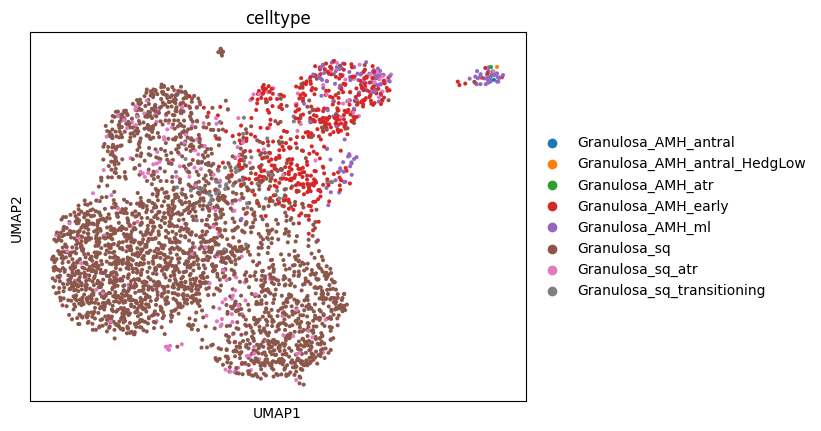

In [35]:
sc.pl.umap(patac,color=['celltype'])

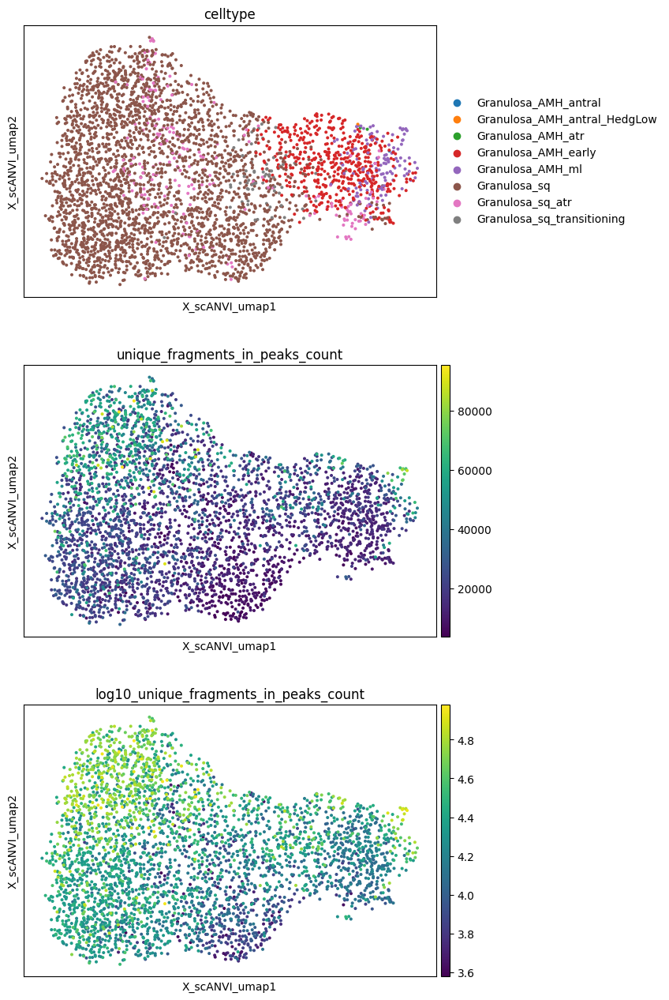

In [27]:
sc.pl.embedding(patac,color=['celltype','unique_fragments_in_peaks_count','log10_unique_fragments_in_peaks_count'],basis='X_scANVI_umap',ncols=1)

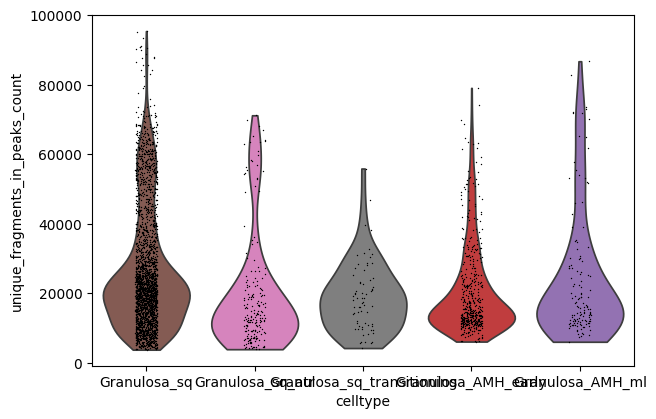

In [26]:
categories_order = ['Granulosa_sq','Granulosa_sq_atr','Granulosa_sq_transitioning','Granulosa_AMH_early','Granulosa_AMH_ml']

sc.pl.violin(patac,'unique_fragments_in_peaks_count','celltype',order=categories_order)

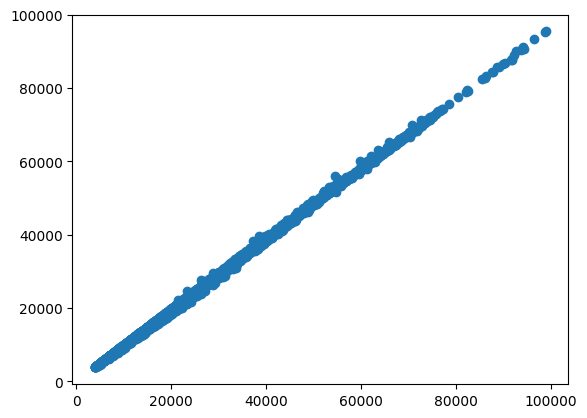

In [53]:
plt.scatter(np.asarray(patac.raw.X.sum(1)).flatten(),patac.obs.unique_fragments_in_peaks_count)


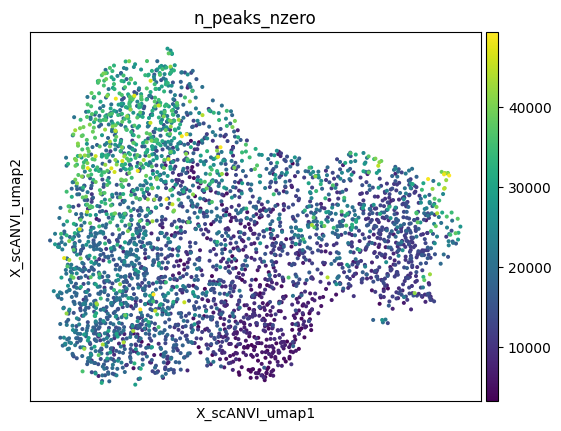

In [54]:
patac.obs['n_peaks_nzero'] = np.asarray((patac.raw.X>0).sum(1)).flatten()
sc.pl.embedding(patac,color=['n_peaks_nzero'],basis='X_scANVI_umap',ncols=1)

In [37]:
patac.obs.celltype.value_counts()

celltype
Granulosa_sq                    2654
Granulosa_AMH_early              480
Granulosa_sq_atr                 200
Granulosa_AMH_ml                 134
Granulosa_sq_transitioning        69
Granulosa_AMH_atr                  2
Granulosa_AMH_antral               1
Granulosa_AMH_antral_HedgLow       1
Name: count, dtype: int64

In [38]:
patac.raw.X.data

array([1, 1, 1, ..., 1, 1, 1], shape=(64905557,), dtype=int32)

In [41]:
#patac.write_h5ad(lustre_path+"/work/pycistopic/results_pycistopic_call_peaks/combined_granulosa.h5ad")

## DARs
### Against all

In [215]:
patac = sc.read_h5ad(lustre_path+"/work/pycistopic/results_pycistopic_call_peaks/combined_granulosa.h5ad")

In [216]:
patac.raw.X.data

array([1, 1, 1, ..., 1, 1, 1], shape=(64905557,), dtype=int32)

In [217]:
patac.X.data

array([0.74721444, 0.74721444, 0.74721444, ..., 0.54639065, 0.54639065,
       0.54639065], shape=(64905557,), dtype=float32)

In [218]:
sc.tl.rank_genes_groups(patac,groupby='celltype',
                        groups=['Granulosa_sq','Granulosa_AMH_early','Granulosa_sq_atr','Granulosa_AMH_ml','Granulosa_sq_transitioning'],
                        method='wilcoxon',pts=True,use_raw=False,tie_correct=True)

In [219]:
pmarkers = sc.get.rank_genes_groups_df(patac,group=None)
pmarkers

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference
0,Granulosa_sq,chr6:112562420-112562920,23.143520,2.356550,1.689460e-118,9.235112e-113,0.624341,0.144307
1,Granulosa_sq,chr18:58828416-58828916,20.570351,2.262306,5.059986e-94,5.531890e-89,0.545968,0.127396
2,Granulosa_sq,chr18:23059863-23060363,18.565168,2.162278,6.149409e-77,3.055871e-72,0.481161,0.119504
3,Granulosa_sq,chr3:11496059-11496559,18.486044,1.956752,2.674750e-76,9.747340e-72,0.517709,0.147689
4,Granulosa_sq,chr21:39023385-39023885,18.148666,2.315621,1.315544e-73,4.230100e-69,0.438960,0.090192
...,...,...,...,...,...,...,...,...
2733150,Granulosa_sq_transitioning,chr3:55569303-55569803,-4.909764,-4.723050,9.118606e-07,3.708715e-04,0.014493,0.287154
2733151,Granulosa_sq_transitioning,chr9:81820156-81820656,-4.926136,-26.906973,8.387143e-07,3.429074e-04,0.000000,0.267569
2733152,Granulosa_sq_transitioning,chr22:29310693-29311193,-4.944944,-3.671211,7.616564e-07,3.135128e-04,0.028986,0.311924
2733153,Granulosa_sq_transitioning,chr2:148812324-148812824,-5.036057,-2.719817,4.752197e-07,2.016846e-04,0.072464,0.373272


In [220]:
pmarkers[(pmarkers.pvals_adj<0.05) & (pmarkers.logfoldchanges > 2) & (pmarkers.pct_nz_group> 0.2)]

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference
0,Granulosa_sq,chr6:112562420-112562920,23.143520,2.356550,1.689460e-118,9.235112e-113,0.624341,0.144307
1,Granulosa_sq,chr18:58828416-58828916,20.570351,2.262306,5.059986e-94,5.531890e-89,0.545968,0.127396
2,Granulosa_sq,chr18:23059863-23060363,18.565168,2.162278,6.149409e-77,3.055871e-72,0.481161,0.119504
4,Granulosa_sq,chr21:39023385-39023885,18.148666,2.315621,1.315544e-73,4.230100e-69,0.438960,0.090192
5,Granulosa_sq,chr16:6618934-6619434,18.119715,2.825855,2.227483e-73,6.764508e-69,0.394499,0.062007
...,...,...,...,...,...,...,...,...
2187858,Granulosa_sq_transitioning,chr3:49460165-49460665,4.915337,2.279727,8.862982e-07,3.617340e-04,0.217391,0.069412
2188038,Granulosa_sq_transitioning,chr4:82893140-82893640,4.805385,2.246037,1.544538e-06,5.550902e-04,0.202899,0.063364
2188239,Granulosa_sq_transitioning,chr3:75559388-75559888,4.665724,2.065576,3.075316e-06,9.750946e-04,0.202899,0.064804
2188249,Granulosa_sq_transitioning,chr3:115401044-115401544,4.647144,2.054881,3.365619e-06,1.059765e-03,0.217391,0.073733


In [221]:
#top5 = markers[(markers.pvals_adj<0.05) & (markers.logfoldchanges > 2) & (markers.pct_nz_group> 0.3) & (markers.pct_nz_reference<0.1)].groupby('group').head(5)
ptop5 = pmarkers[(pmarkers.pvals_adj<0.01) & (pmarkers.logfoldchanges > 2)].groupby('group').head(5)
ptop5

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference
0,Granulosa_sq,chr6:112562420-112562920,23.143520,2.356550,1.689460e-118,9.235112e-113,0.624341,0.144307
1,Granulosa_sq,chr18:58828416-58828916,20.570351,2.262306,5.059986e-94,5.531890e-89,0.545968,0.127396
2,Granulosa_sq,chr18:23059863-23060363,18.565168,2.162278,6.149409e-77,3.055871e-72,0.481161,0.119504
4,Granulosa_sq,chr21:39023385-39023885,18.148666,2.315621,1.315544e-73,4.230100e-69,0.438960,0.090192
5,Granulosa_sq,chr16:6618934-6619434,18.119715,2.825855,2.227483e-73,6.764508e-69,0.394499,0.062007
546631,Granulosa_AMH_early,chr22:22559108-22559608,18.757935,2.178482,1.667552e-78,4.557677e-73,0.466667,0.126756
546632,Granulosa_AMH_early,chr22:43985512-43986012,17.804199,3.112769,6.556426e-71,8.959865e-66,0.229167,0.028749
546633,Granulosa_AMH_early,chr20:51022936-51023436,17.259438,2.391138,9.503276e-67,1.038957e-61,0.370833,0.093760
546634,Granulosa_AMH_early,chr19:4153259-4153759,17.093014,3.012840,1.672978e-65,1.524169e-60,0.225000,0.030709
546635,Granulosa_AMH_early,chr10:45095170-45095670,16.689125,2.730692,1.572576e-62,1.228027e-57,0.239583,0.037569


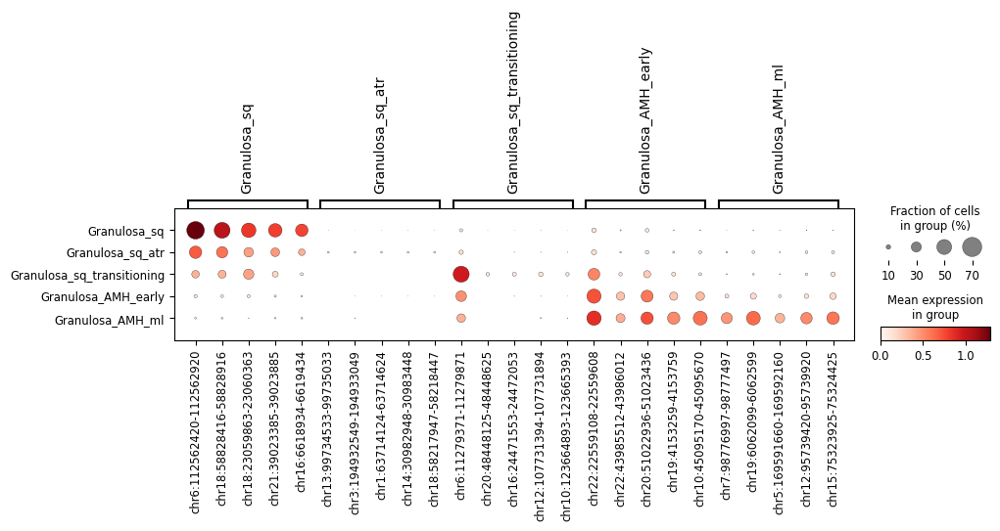

In [222]:
categories_order = ['Granulosa_sq','Granulosa_sq_atr','Granulosa_sq_transitioning','Granulosa_AMH_early','Granulosa_AMH_ml']
peaks = {g:ptop5.names[ptop5.group==g] for g in categories_order if (ptop5.group==g).sum(0)>0}
sc.pl.dotplot(patac[patac.obs.celltype.isin(categories_order)],peaks,groupby='celltype',categories_order=categories_order)

In [223]:
peaksn = []
for v in peaks.values():
    peaksn.extend(v)    

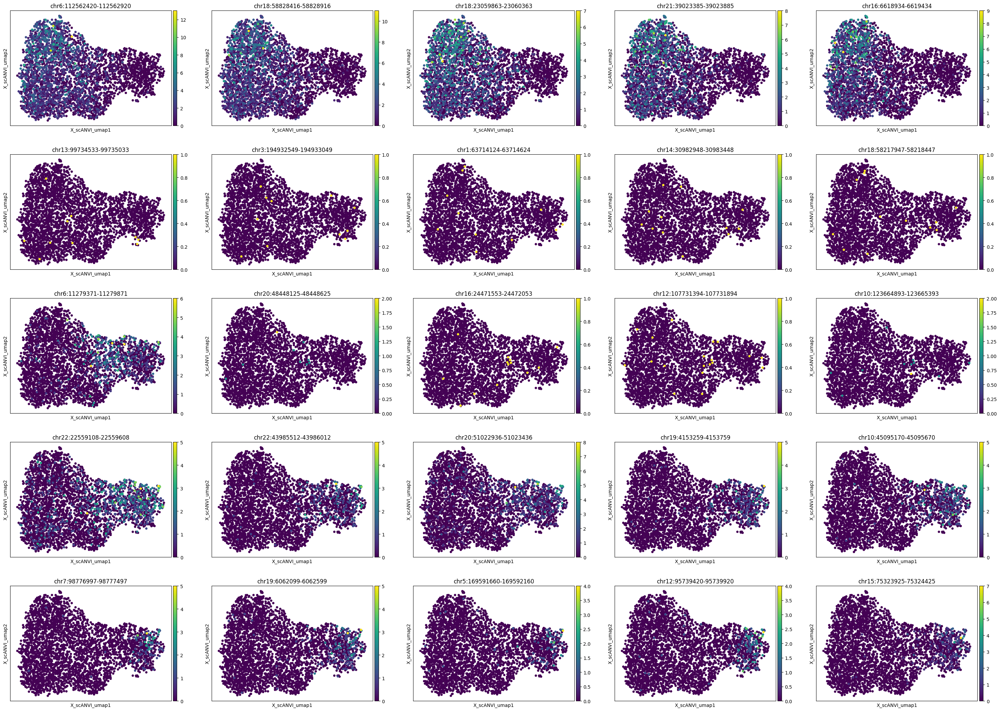

In [224]:
sc.pl.embedding(patac,color=peaksn,basis='X_scANVI_umap',size=100,sort_order=True,ncols=5)

In [225]:
pmarkers[(pmarkers.pvals_adj<0.05) & (pmarkers.logfoldchanges > np.log(2))].to_csv('pycistopic_granulosa_dars.csv')
pmarkers.to_csv('pycistopic_granulosa_all_peaks.csv')

In [226]:
pmarkers.loc[pmarkers.names=='chr19:2240846-2241346',:]

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference
485628,Granulosa_sq,chr19:2240846-2241346,-1.888856,-0.649374,0.058911,0.226352,0.067822,0.085682
591268,Granulosa_AMH_early,chr19:2240846-2241346,2.229070,0.728223,0.025809,0.164608,0.095833,0.068605
1395310,Granulosa_sq_atr,chr19:2240846-2241346,-0.628503,0.132445,0.529674,0.860843,0.060000,0.073032
1933498,Granulosa_AMH_ml,chr19:2240846-2241346,-0.240408,-0.171140,0.810014,0.912190,0.067164,0.072498
2209547,Granulosa_sq_transitioning,chr19:2240846-2241346,1.917877,1.172391,0.055127,0.766577,0.130435,0.071141


In [227]:
pmarkers.loc[pmarkers.names=='chr19:2241363-2241863',:]


,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference
492302,Granulosa_sq,chr19:2241363-2241863,-2.030927,-0.773104,0.042262,0.183624,0.050867,0.067644
580210,Granulosa_AMH_early,chr19:2241363-2241863,2.583897,0.883498,0.009769,0.083316,0.079167,0.051290
1273671,Granulosa_sq_atr,chr19:2241363-2241863,0.080244,0.529650,0.936043,0.988373,0.055000,0.055073
2137517,Granulosa_AMH_ml,chr19:2241363-2241863,-1.312047,-1.170871,0.189504,0.672522,0.029851,0.056061
2214750,Granulosa_sq_transitioning,chr19:2241363-2241863,1.761895,1.181257,0.078087,0.766577,0.101449,0.054147


In [228]:
pmarkers.loc[(pmarkers.pvals_adj<0.05) & (pmarkers.logfoldchanges > np.log(2)),'group'].value_counts()[categories_order]

group
Granulosa_sq                  25329
Granulosa_sq_atr                995
Granulosa_sq_transitioning     5998
Granulosa_AMH_early           27198
Granulosa_AMH_ml              30818
Name: count, dtype: int64

In [229]:
pmarkers.loc[(pmarkers.pvals_adj<0.05) & (pmarkers.logfoldchanges < -np.log(2)),'group'].value_counts()[categories_order]

group
Granulosa_sq                  31155
Granulosa_sq_atr                328
Granulosa_sq_transitioning      269
Granulosa_AMH_early           18573
Granulosa_AMH_ml               6421
Name: count, dtype: int64

### Against Granulosa_sq
#### all cells

In [230]:
patac = sc.read_h5ad(lustre_path+"/work/pycistopic/results_pycistopic_call_peaks/combined_granulosa.h5ad")

In [231]:
ctypes2comp = ['Granulosa_sq_transitioning','Granulosa_AMH_early','Granulosa_AMH_ml']
sc.tl.rank_genes_groups(patac,groupby='celltype',
                        groups=ctypes2comp,
                        reference='Granulosa_sq',
                        method='wilcoxon',pts=True,use_raw=False,tie_correct=True)

/software/conda/users/pm19/muon/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:345: RuntimeWarning: invalid value encountered in divide
  scores = (
/software/conda/users/pm19/muon/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:345: RuntimeWarning: invalid value encountered in divide
  scores = (


In [232]:
pmarkers = sc.get.rank_genes_groups_df(patac,group=None)
pmarkers

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group
0,Granulosa_sq_transitioning,chr6:11279371-11279871,15.483080,3.503669,4.513363e-54,2.467144e-48,0.550725
1,Granulosa_sq_transitioning,chr2:21545016-21545516,12.318447,5.491327,7.206830e-35,1.969738e-29,0.101449
2,Granulosa_sq_transitioning,chr18:27633235-27633735,12.276065,3.574893,1.217790e-34,2.218939e-29,0.260870
3,Granulosa_sq_transitioning,chr6:11480371-11480871,12.233151,4.445061,2.067582e-34,2.825511e-29,0.173913
4,Granulosa_sq_transitioning,chr16:24471553-24472053,11.576571,5.333124,5.416980e-31,5.922178e-26,0.086957
...,...,...,...,...,...,...,...
1639888,Granulosa_AMH_ml,chr3:4978591-4979091,-10.762808,-2.871781,5.157433e-27,3.546179e-24,0.156716
1639889,Granulosa_AMH_ml,chr18:58828416-58828916,-10.826386,-4.906894,2.581426e-27,1.818412e-24,0.029851
1639890,Granulosa_AMH_ml,chr19:18657619-18658119,-10.850780,-3.021427,1.977311e-27,1.409204e-24,0.126866
1639891,Granulosa_AMH_ml,chr19:50328929-50329429,-11.012520,-2.272902,3.325693e-28,2.528410e-25,0.253731


In [233]:
pmarkers[(pmarkers.pvals_adj<0.05) & (pmarkers.logfoldchanges > 2) & (pmarkers.pct_nz_group> 0.2)]

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group
0,Granulosa_sq_transitioning,chr6:11279371-11279871,15.483080,3.503669,4.513363e-54,2.467144e-48,0.550725
2,Granulosa_sq_transitioning,chr18:27633235-27633735,12.276065,3.574893,1.217790e-34,2.218939e-29,0.260870
15,Granulosa_sq_transitioning,chr10:17178791-17179291,9.401746,2.729781,5.366498e-21,1.833434e-16,0.449275
21,Granulosa_sq_transitioning,chr2:128458103-128458603,9.208216,3.966136,3.315899e-20,8.083036e-16,0.202899
30,Granulosa_sq_transitioning,chr1:16456799-16457299,8.837064,2.723092,9.826723e-19,1.732771e-14,0.391304
...,...,...,...,...,...,...,...
1098924,Granulosa_AMH_ml,chr14:102486977-102487477,6.046983,2.025697,1.475831e-09,1.273658e-07,0.208955
1099497,Granulosa_AMH_ml,chr5:151085468-151085968,5.883160,2.058465,4.025065e-09,3.133209e-07,0.201493
1099567,Granulosa_AMH_ml,chr17:44557000-44557500,5.832002,2.118226,5.476635e-09,4.201093e-07,0.208955
1099616,Granulosa_AMH_ml,chr15:59105383-59105883,5.809327,2.298926,6.272458e-09,4.770061e-07,0.201493


In [234]:
#top5 = markers[(markers.pvals_adj<0.05) & (markers.logfoldchanges > 2) & (markers.pct_nz_group> 0.3) & (markers.pct_nz_reference<0.1)].groupby('group').head(5)
ptop5 = pmarkers[(pmarkers.pvals_adj<0.01) & (pmarkers.logfoldchanges > 2)].groupby('group').head(5)
ptop5

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group
0,Granulosa_sq_transitioning,chr6:11279371-11279871,15.483080,3.503669,4.513363e-54,2.467144e-48,0.550725
1,Granulosa_sq_transitioning,chr2:21545016-21545516,12.318447,5.491327,7.206830e-35,1.969738e-29,0.101449
2,Granulosa_sq_transitioning,chr18:27633235-27633735,12.276065,3.574893,1.217790e-34,2.218939e-29,0.260870
3,Granulosa_sq_transitioning,chr6:11480371-11480871,12.233151,4.445061,2.067582e-34,2.825511e-29,0.173913
4,Granulosa_sq_transitioning,chr16:24471553-24472053,11.576571,5.333124,5.416980e-31,5.922178e-26,0.086957
546631,Granulosa_AMH_early,chr10:45095170-45095670,21.307981,4.310190,9.573514e-101,5.233180e-95,0.239583
546632,Granulosa_AMH_early,chr19:4153259-4153759,21.162754,4.703764,2.105552e-99,5.754800e-94,0.225000
546633,Granulosa_AMH_early,chr22:22559108-22559608,20.776493,2.621902,7.063254e-96,9.652484e-91,0.466667
546634,Granulosa_AMH_early,chr2:200944813-200945313,20.031158,5.357717,2.947175e-89,3.222035e-84,0.197917
546635,Granulosa_AMH_early,chr22:43985512-43986012,19.846258,3.930069,1.187213e-87,1.081612e-82,0.229167


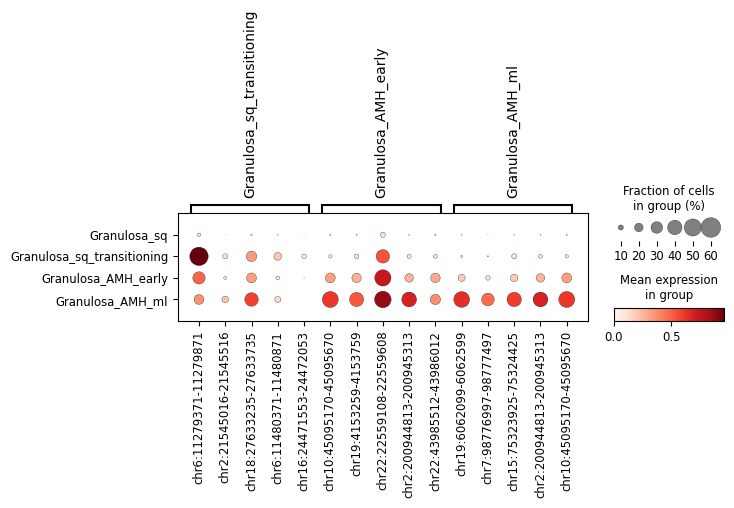

In [235]:
categories_order = ['Granulosa_sq','Granulosa_sq_transitioning','Granulosa_AMH_early','Granulosa_AMH_ml']
peaks = {g:ptop5.names[ptop5.group==g] for g in categories_order if (ptop5.group==g).sum(0)>0}
sc.pl.dotplot(patac[patac.obs.celltype.isin(categories_order)],peaks,groupby='celltype',categories_order=categories_order)

In [236]:
peaksn = []
for v in peaks.values():
    peaksn.extend(v)    

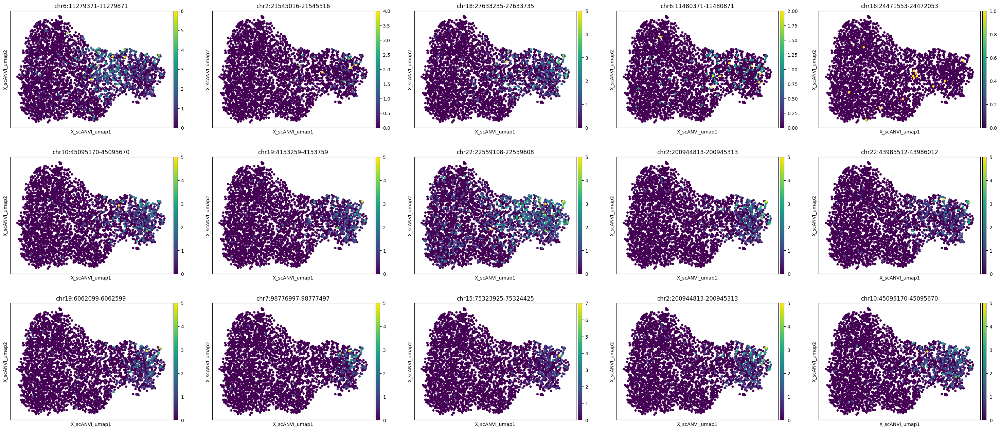

In [237]:
sc.pl.embedding(patac,color=peaksn,basis='X_scANVI_umap',size=100,sort_order=True,ncols=5)

In [238]:
pmarkers.loc[(pmarkers.pvals_adj<0.05) & (pmarkers.logfoldchanges > np.log(2)),'group'].value_counts()[ctypes2comp]

group
Granulosa_sq_transitioning     7439
Granulosa_AMH_early           31819
Granulosa_AMH_ml              37226
Name: count, dtype: int64

In [239]:
pmarkers.loc[(pmarkers.pvals_adj<0.05) & (pmarkers.logfoldchanges < -np.log(2)),'group'].value_counts()[ctypes2comp]

group
Granulosa_sq_transitioning      712
Granulosa_AMH_early           21668
Granulosa_AMH_ml               8929
Name: count, dtype: int64

In [240]:
pmarkers.to_csv('pycistopic_granulosa_vs-sq_all-cells_all_peaks.csv')

#### balanced subsetting

In [241]:
patac.obs.celltype.value_counts() # 69 of Granulosa_sq_transitioning

celltype
Granulosa_sq                    2654
Granulosa_AMH_early              480
Granulosa_sq_atr                 200
Granulosa_AMH_ml                 134
Granulosa_sq_transitioning        69
Granulosa_AMH_atr                  2
Granulosa_AMH_antral               1
Granulosa_AMH_antral_HedgLow       1
Name: count, dtype: int64

In [242]:
patacf = patac[patac.obs.celltype.isin(['Granulosa_sq','Granulosa_sq_transitioning','Granulosa_AMH_early','Granulosa_AMH_ml']),]

In [243]:
ct = patacf.obs.celltype.value_counts()
cell_cnt = ct[ct.index !='Granulosa_sq'].min()
cell_cnt

np.int64(69)

In [244]:
sids = list(patacf.obs_names[patacf.obs.celltype.isin(['Granulosa_sq','Granulosa_sq_transitioning'])])
for ct in ['Granulosa_AMH_early','Granulosa_AMH_ml']:
    sids.extend(pd.Series(patacf.obs_names[patacf.obs.celltype == ct]).sample(cell_cnt, random_state=123))

In [245]:
patacf = patac[sids,].copy()
patacf.obs['celltype'].value_counts()

celltype
Granulosa_sq                  2654
Granulosa_AMH_early             69
Granulosa_AMH_ml                69
Granulosa_sq_transitioning      69
Name: count, dtype: int64

In [246]:
sc.tl.rank_genes_groups(patacf,groupby='celltype',
                        groups=ctypes2comp,
                        reference='Granulosa_sq',
                        method='wilcoxon',pts=True,use_raw=False,tie_correct=True)

/software/conda/users/pm19/muon/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:345: RuntimeWarning: invalid value encountered in divide
  scores = (
/software/conda/users/pm19/muon/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:345: RuntimeWarning: invalid value encountered in divide
  scores = (
/software/conda/users/pm19/muon/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:345: RuntimeWarning: invalid value encountered in divide
  scores = (


In [247]:
pmarkersf = sc.get.rank_genes_groups_df(patacf,group=None)
pmarkersf

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group
0,Granulosa_sq_transitioning,chr6:11279371-11279871,15.483080,3.503669,4.513363e-54,2.467144e-48,0.550725
1,Granulosa_sq_transitioning,chr2:21545016-21545516,12.318447,5.491327,7.206830e-35,1.969738e-29,0.101449
2,Granulosa_sq_transitioning,chr18:27633235-27633735,12.276065,3.574893,1.217790e-34,2.218939e-29,0.260870
3,Granulosa_sq_transitioning,chr6:11480371-11480871,12.233151,4.445061,2.067582e-34,2.825511e-29,0.173913
4,Granulosa_sq_transitioning,chr16:24471553-24472053,11.576571,5.333124,5.416980e-31,5.922178e-26,0.086957
...,...,...,...,...,...,...,...
1639888,Granulosa_AMH_ml,chr18:23059863-23060363,-7.410513,-27.885921,1.258114e-13,2.419860e-11,0.000000
1639889,Granulosa_AMH_ml,chr19:18657619-18658119,-7.424020,-2.591290,1.136178e-13,2.210213e-11,0.144928
1639890,Granulosa_AMH_ml,chr3:4978591-4979091,-7.570836,-2.732141,3.708309e-14,7.643578e-12,0.202899
1639891,Granulosa_AMH_ml,chr18:58828416-58828916,-7.968318,-5.622217,1.608489e-15,4.022185e-13,0.014493


In [248]:
pmarkersf.loc[(pmarkersf.pvals_adj<0.05) & (pmarkersf.logfoldchanges > np.log(2)),'group'].value_counts()[ctypes2comp]

group
Granulosa_sq_transitioning     7439
Granulosa_AMH_early           13194
Granulosa_AMH_ml              39926
Name: count, dtype: int64

In [249]:
pmarkersf.loc[(pmarkersf.pvals_adj<0.05) & (pmarkersf.logfoldchanges < -np.log(2)),'group'].value_counts()[ctypes2comp]

group
Granulosa_sq_transitioning     712
Granulosa_AMH_early           2221
Granulosa_AMH_ml              3370
Name: count, dtype: int64

In [250]:
pmarkersf

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group
0,Granulosa_sq_transitioning,chr6:11279371-11279871,15.483080,3.503669,4.513363e-54,2.467144e-48,0.550725
1,Granulosa_sq_transitioning,chr2:21545016-21545516,12.318447,5.491327,7.206830e-35,1.969738e-29,0.101449
2,Granulosa_sq_transitioning,chr18:27633235-27633735,12.276065,3.574893,1.217790e-34,2.218939e-29,0.260870
3,Granulosa_sq_transitioning,chr6:11480371-11480871,12.233151,4.445061,2.067582e-34,2.825511e-29,0.173913
4,Granulosa_sq_transitioning,chr16:24471553-24472053,11.576571,5.333124,5.416980e-31,5.922178e-26,0.086957
...,...,...,...,...,...,...,...
1639888,Granulosa_AMH_ml,chr18:23059863-23060363,-7.410513,-27.885921,1.258114e-13,2.419860e-11,0.000000
1639889,Granulosa_AMH_ml,chr19:18657619-18658119,-7.424020,-2.591290,1.136178e-13,2.210213e-11,0.144928
1639890,Granulosa_AMH_ml,chr3:4978591-4979091,-7.570836,-2.732141,3.708309e-14,7.643578e-12,0.202899
1639891,Granulosa_AMH_ml,chr18:58828416-58828916,-7.968318,-5.622217,1.608489e-15,4.022185e-13,0.014493


In [251]:
pmarkersf.to_csv('pycistopic_granulosa_vs-sq_subset-cells_all_peaks.csv')

# Match snapatac2 and pycistopic peaks

In [65]:
def coor2GRanges(coors):
    peaks = coors.str.split('[:-]')
    starts = [int(p[1]) for p in peaks]
    width= [int(p[2]) - int(p[1]) + 1 for p in peaks]
    peaks = gr.GenomicRanges(
        seqnames = [p[0] for p in peaks],
        ranges = iranges.IRanges(start = starts,width= width)
    )
    return peaks

In [68]:
ppeaks = coor2GRanges(patac.var_names)
speaks = coor2GRanges(atac.var_names)

In [92]:
hits = ppeaks.find_overlaps(speaks,ignore_strand=True,min_overlap=250)
hits.shape

(43743, 2)

In [93]:
hits = pd.DataFrame({'sinx':hits['query_hits'],'pinx':hits['self_hits']}) 
hits

,sinx,pinx
0,0,28737
1,1,16688
2,2,17365
3,3,27810
4,4,17366
...,...,...
43738,48911,541713
43739,48912,541307
43740,48913,541716
43741,48914,541308


In [94]:
hits.sinx.value_counts().value_counts()

count
1    43743
Name: count, dtype: int64

In [95]:
hits.pinx.value_counts().value_counts()

count
1    43743
Name: count, dtype: int64

In [158]:
s2p = dict(zip(atac.var_names[hits.sinx],patac.var_names[hits.pinx]))

In [159]:
pd.Series(atac.var_names.isin(s2p.keys())).value_counts()

True     43743
False     5174
Name: count, dtype: int64

In [160]:
atac.var['pycistopic_peak'] = atac.var_names

In [161]:
atac.var['pycistopic_peak'] = list(atac.var['pycistopic_peak'].rename(s2p))
atac.var.loc[~atac.var_names.isin(s2p.keys()),'pycistopic_peak'] = pd.NA
atac.var

,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,pycistopic_peak
chr1:826584-827085,171,0.048947,95.324036,179,chr1:826584-827085
chr1:827301-827802,1259,0.508067,65.572874,1858,chr1:827301-827802
chr1:869661-870162,783,0.291222,78.589007,1065,chr1:869661-870162
chr1:904510-905011,927,0.334974,74.651354,1225,chr1:904510-905011
chr1:905169-905670,194,0.060159,94.695105,220,chr1:905169-905670
...,...,...,...,...,...
chrX:155745727-155746228,142,0.044025,96.117036,161,chrX:155745727-155746228
chrX:155767379-155767880,404,0.141099,88.952693,516,chrX:155767379-155767880
chrX:155767936-155768437,131,0.038009,96.417829,139,chrX:155767936-155768437
chrX:155881015-155881516,1123,0.433142,69.291769,1584,<NA>


In [162]:
atac.var['pycistopic_peak'].isna().value_counts()

pycistopic_peak
False    43743
True      5174
Name: count, dtype: int64

In [163]:
markers['pycistopic_peak'] = list(atac.var.loc[markers.names,'pycistopic_peak'])

In [166]:
top5 = markers[(markers.pvals_adj<0.01) & (markers.logfoldchanges > 2)].groupby('group').head(5)
top5

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,pycistopic_peak
0,Granulosa_sq,chr6:112562433-112562934,27.724682,2.529666,5.584338e-146,2.731691e-141,0.614498,0.133578,chr6:112562433-112562934
1,Granulosa_sq,chr17:8420231-8420732,24.807043,3.208147,7.581596e-124,1.854345e-119,0.402389,0.042892,<NA>
2,Granulosa_sq,chr18:58828334-58828835,23.452438,2.341442,2.667901e-109,4.350190e-105,0.524300,0.120098,chr18:58828334-58828835
3,Granulosa_sq,chr21:39023231-39023732,21.295227,2.348202,3.192921e-92,3.904703e-88,0.460873,0.099265,chr21:39023231-39023732
4,Granulosa_sq,chr5:149406492-149406993,20.538692,2.109268,3.176797e-86,3.107988e-82,0.483114,0.139706,chr5:149406492-149406993
48917,Granulosa_AMH_early,chr22:22559058-22559559,12.748835,2.227203,1.495490e-32,1.866196e-30,0.454741,0.126978,chr22:22559058-22559559
48918,Granulosa_AMH_early,chr19:8367313-8367814,12.048816,2.007194,1.116597e-29,1.177168e-27,0.443966,0.146763,chr19:8367313-8367814
48919,Granulosa_AMH_early,chr20:51022947-51023448,11.326223,2.442520,1.227891e-26,1.090105e-24,0.362069,0.090647,chr20:51022947-51023448
48923,Granulosa_AMH_early,chr16:18983635-18984136,9.676194,2.162203,1.977048e-20,1.177969e-18,0.310345,0.088129,chr16:18983635-18984136
48924,Granulosa_AMH_early,chr17:76480554-76481055,9.557272,2.262193,5.280654e-20,3.031852e-18,0.293103,0.075540,chr17:76480554-76481055


In [174]:
pmarkers[(pmarkers.pvals_adj<0.05) & (pmarkers.logfoldchanges > np.log(2))].names.unique().shape

(50811,)

In [176]:
markers.names.unique().shape

(8477,)